In [ ]:
# Install and authenticate Kaggle API
!pip install -q kaggle

# Upload your kaggle.json (API token file)
from google.colab import files
files.upload()   # Upload kaggle.json from your Kaggle account

# Make a directory for Kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json


In [ ]:
# Download the dataset from Kaggle
!kaggle datasets download -d akhatova/pcb-defects

# Unzip dataset
!unzip -q pcb-defects.zip -d ./pcb_defects


Dataset URL: https://www.kaggle.com/datasets/akhatova/pcb-defects
License(s): unknown
100% 1.88G/1.88G [00:12<00:00, 191MB/s]
100% 1.88G/1.88G [00:12<00:00, 156MB/s]


In [ ]:
#Importing the standard libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
import os
import random
import re
import shutil
sns.set_style('darkgrid')
sns.set_palette('pastel')

import warnings
warnings.filterwarnings('ignore')


# **Understanding the dataset**

In [ ]:
#Defining the input
input_dir= "pcb_defects/PCB_DATASET"
os.listdir(input_dir)

['PCB_USED', 'Annotations', 'rotate.py', 'rotation', 'images']

*  **PCB USED folder**- contains the 12 template images we used in the dataset.
* **images folder**- contains the PCB images subclassed into different types.
* **rotation folder**- contains the rotated PCB images subclassed into different types as well as rotation angle
* **annotations folder**- contains the annotations for bounding box of each images





**Analyzing the PCB USED folder**

In [ ]:
template_dir=os.path.join(input_dir,'PCB_USED')
template_dir

'pcb_defects/PCB_DATASET/PCB_USED'

In [ ]:
#Creating function to visualize images:
def visualize_img(dir_name,nos_):
    k=1
    plt.figure(figsize=(8,(nos_//2)*6))
    for filename in os.listdir(dir_name)[0:nos_]:
        if filename.lower().endswith(('.jpg','.jpeg','.png')):
            ax=plt.subplot((nos_//2)+1,2,k)
            img_path=os.path.join(dir_name,filename)
            img=plt.imread(img_path)
            ax.imshow(img)
            ax.set_xlabel(filename)
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])
            k+=1
    plt.tight_layout()
    plt.show()

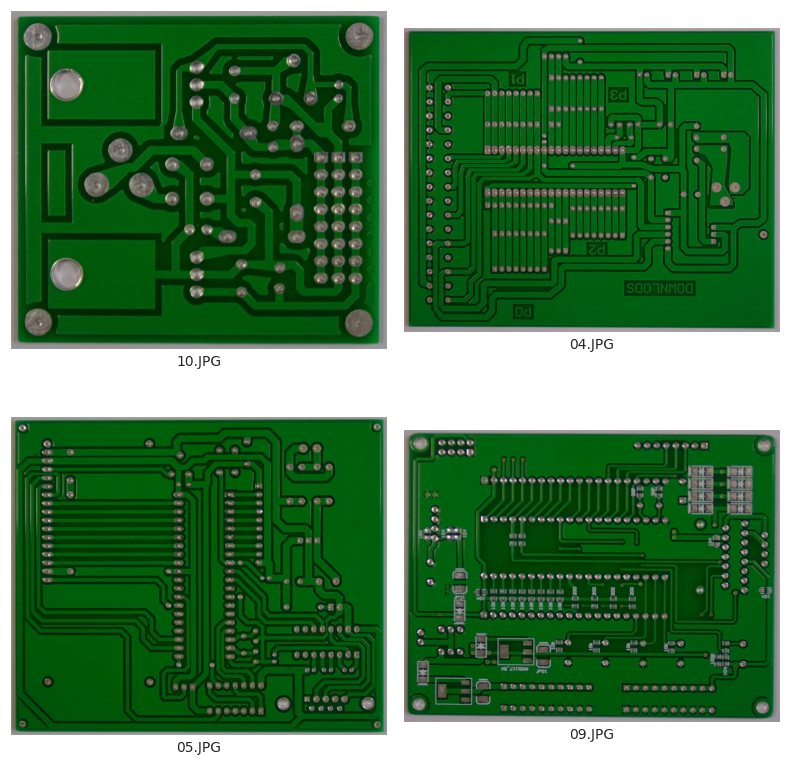

No of template images:10


In [ ]:
visualize_img(template_dir,nos_=4)

print(f'No of template images:{len(os.listdir(template_dir))}')

**Analyzing the images folder**

In [ ]:
#Defining the image directory
img_dir=os.path.join(input_dir,'images')

#Listing the types of defects
os.listdir(img_dir)
types_defect=os.listdir(os.path.join(input_dir,'images'))
types_defect

['Open_circuit',
 'Missing_hole',
 'Mouse_bite',
 'Spur',
 'Short',
 'Spurious_copper']

In [ ]:
#Creating an image path list for ready refernce
img_path_list=[]
#Creating img_path list
for sub_cat in types_defect:
    for file in os.listdir(os.path.join(img_dir,sub_cat)):

        img_path_list.append(os.path.join(img_dir,sub_cat,file))


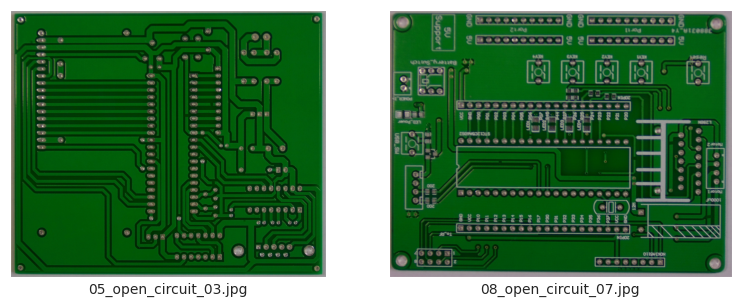

No of Open_circuit images:116


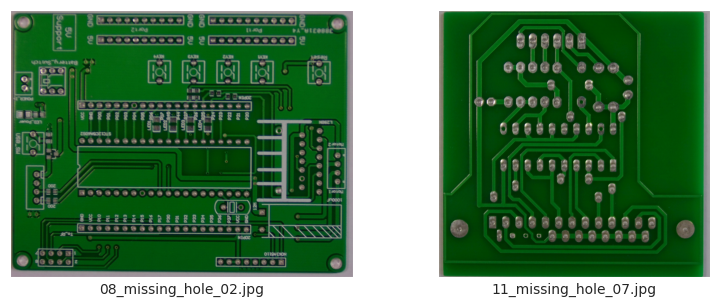

No of Missing_hole images:115


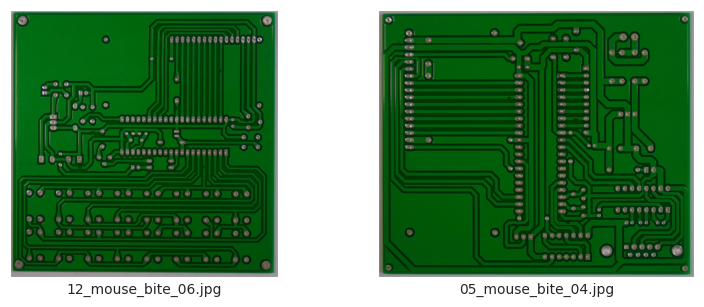

No of Mouse_bite images:115


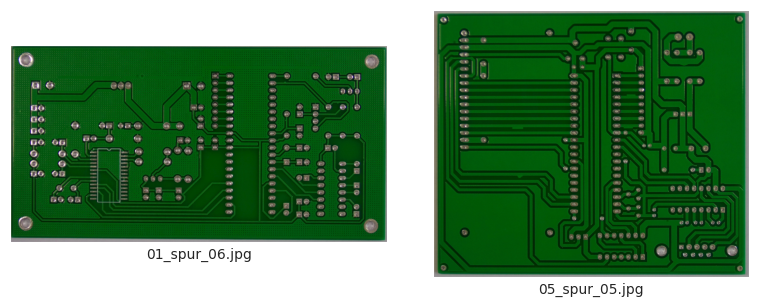

No of Spur images:115


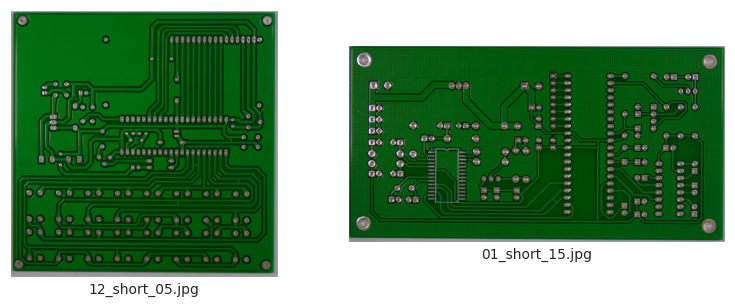

No of Short images:116


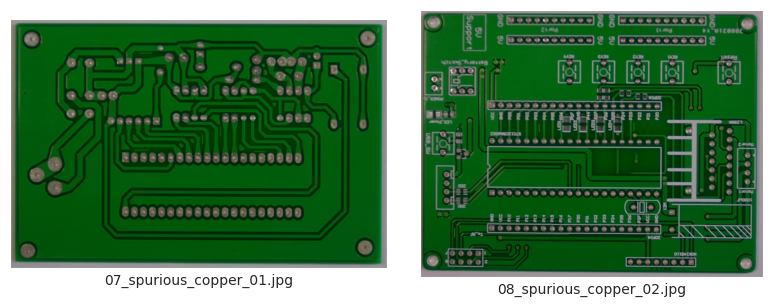

No of Spurious_copper images:116


In [ ]:
#Vizualizing defect images for each type
df_defect=pd.DataFrame(columns=['No of defect']) #dataframe for counting no of defects
for sub_cat in types_defect:
    visualize_img(os.path.join(img_dir,sub_cat),nos_=2)  #Visualizing 2 types of defect for each type

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(img_dir,sub_cat)))}')

    df_defect.loc[sub_cat]=len(os.listdir(os.path.join(img_dir,sub_cat)))


In [ ]:
#No. of defects by type
df_defect

,No of defect
Open_circuit,116
Missing_hole,115
Mouse_bite,115
Spur,115
Short,116
Spurious_copper,116


**Analyzing rotated folder**

In [ ]:
rotated_dir=os.path.join(input_dir,'rotation')
os.listdir(rotated_dir)

['Spurious_copper_angles.txt',
 'Spur_rotation',
 'Spurious_copper_rotation',
 'Missing_hole_rotation',
 'Open_circuit_angles.txt',
 'Spur_angles.txt',
 'Open_circuit_rotation',
 'Mouse_bite_angles.txt',
 'Short_rotation',
 'Mouse_bite_rotation',
 'Missing_hole_angles.txt',
 'Short_angles.txt']

In [ ]:
rotated_angle_list=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')]
rotated_angle_list

['Spurious_copper_angles.txt',
 'Open_circuit_angles.txt',
 'Spur_angles.txt',
 'Mouse_bite_angles.txt',
 'Missing_hole_angles.txt',
 'Short_angles.txt']

In [ ]:
types_defect_rotated=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')==False]
types_defect_rotated

['Spur_rotation',
 'Spurious_copper_rotation',
 'Missing_hole_rotation',
 'Open_circuit_rotation',
 'Short_rotation',
 'Mouse_bite_rotation']

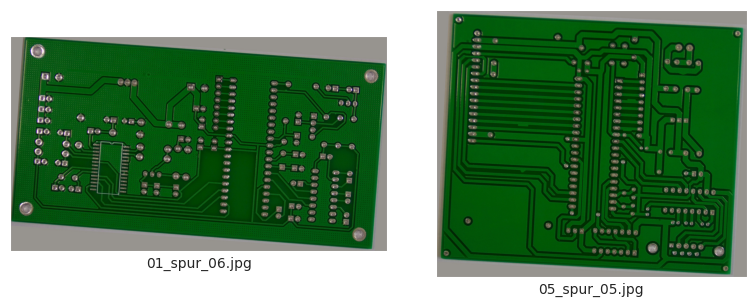

No of Spur_rotation images:115


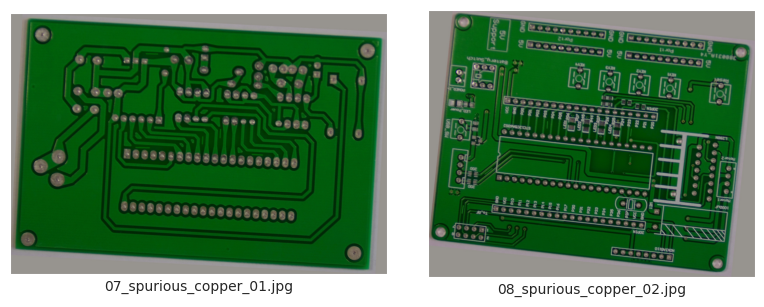

No of Spurious_copper_rotation images:116


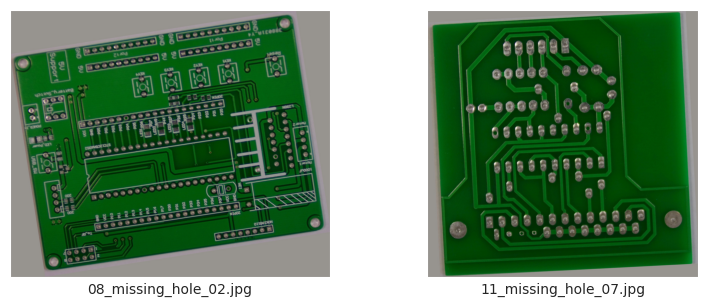

No of Missing_hole_rotation images:115


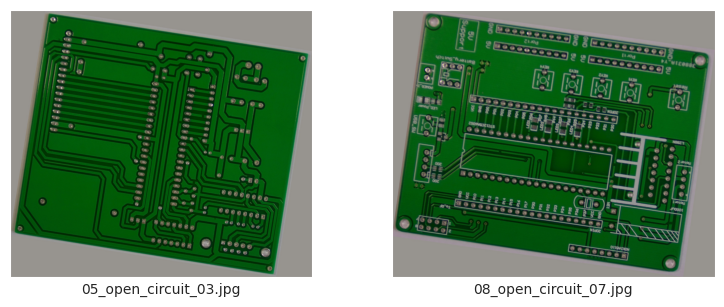

No of Open_circuit_rotation images:116


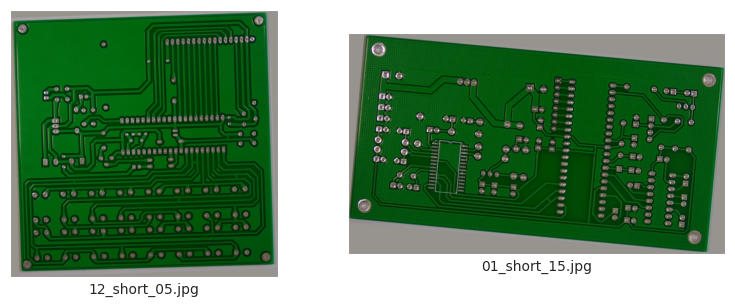

No of Short_rotation images:116


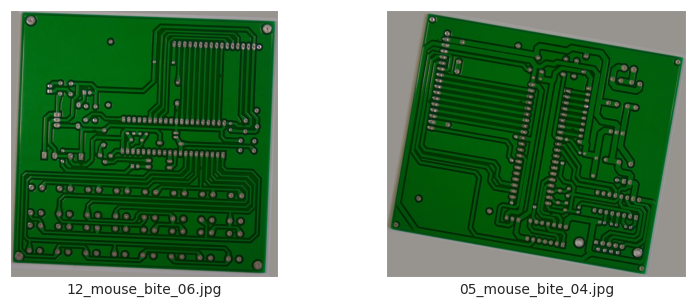

No of Mouse_bite_rotation images:115


In [ ]:
#Vizualizing rotated defects
df_defect_rotated=pd.DataFrame(columns=['No of defect'])
for sub_cat in types_defect_rotated:
    visualize_img(os.path.join(rotated_dir,sub_cat),nos_=2)

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(rotated_dir,sub_cat)))}')

    df_defect_rotated.loc[sub_cat]=len(os.listdir(os.path.join(rotated_dir,sub_cat)))

In [ ]:
#No. of defects by type  rotated
df_defect_rotated

,No of defect
Spur_rotation,115
Spurious_copper_rotation,116
Missing_hole_rotation,115
Open_circuit_rotation,116
Short_rotation,116
Mouse_bite_rotation,115


In [ ]:
#Reading the rotation text files

df_rotation_angle=pd.DataFrame(columns=['Line','Angle'])
for filename in rotated_angle_list:
    with open(os.path.join(rotated_dir,filename),'r') as f:
        lines=f.readlines()
        for line in lines:
            text,angle=line.split()
            df_rotation_angle=pd.concat([df_rotation_angle,pd.DataFrame({'Line':[text],'Angle':[angle]})],axis=0)


In [ ]:
df_rotation_angle

,Line,Angle
0,04_spurious_copper_01,1
0,04_spurious_copper_20,-10
0,09_spurious_copper_05,1
0,01_spurious_copper_07,10
0,04_spurious_copper_15,-10
...,...,...
0,07_short_02,6
0,09_short_01,3
0,07_short_03,0
0,11_short_03,1


**Analyzing the annotate folder**

In [ ]:
annote_dir=os.path.join(input_dir,'Annotations')
annote_dir

'pcb_defects/PCB_DATASET/Annotations'

In [ ]:
type_annot=os.listdir(annote_dir)
type_annot

['Open_circuit',
 'Missing_hole',
 'Mouse_bite',
 'Spur',
 'Short',
 'Spurious_copper']

In [ ]:
df_annot_nos=pd.DataFrame(columns=['No of annotations'])
#Checking the length of annotation itms
for i in type_annot:
    df_annot_nos.loc[i]=len(os.listdir(os.path.join(annote_dir,i)))
df_annot_nos

,No of annotations
Open_circuit,116
Missing_hole,115
Mouse_bite,115
Spur,115
Short,116
Spurious_copper,116


We see that we have an annotation file for each image

In [ ]:
#Checking the type of files
file_list=os.listdir(os.path.join(annote_dir,'Mouse_bite'))
file_list[0:5]

['04_mouse_bite_20.xml',
 '06_mouse_bite_09.xml',
 '01_mouse_bite_14.xml',
 '04_mouse_bite_09.xml',
 '06_mouse_bite_05.xml']

We see that all files are in XML format, so we have to parse the data

In [ ]:
#importing xml ET to parse xml file
import xml.etree.ElementTree as ET



In [ ]:
tree = ET.parse(os.path.join(os.path.join(annote_dir,'Mouse_bite'),'01_mouse_bite_11.xml'))
root = tree.getroot()

In [ ]:
#getting the structure of XML file
print(ET.tostring(root, encoding='utf8').decode('utf8'))

<?xml version='1.0' encoding='utf8'?>
<annotation>
	<folder>Mouse_bite</folder>
	<filename>01_mouse_bite_11.jpg</filename>
	<path>/home/weapon/Desktop/PCB_DATASET/Mouse_bite/01_mouse_bite_11.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>3034</width>
		<height>1586</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1199</xmin>
			<ymin>966</ymin>
			<xmax>1234</xmax>
			<ymax>1004</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>2042</xmin>
			<ymin>755</ymin>
			<xmax>2073</xmax>
			<ymax>786</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1472</xmin>
			<ymin>607</ymin>
		

In [ ]:
#Parsing XML to return Bounding box dimensions
def parse_xml(xml_file):

    data=[]

    tree = ET.parse(xml_file)
    root = tree.getroot()

    filename = root.find('filename').text
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    for obj in root.findall('object'):
        name = obj.find('name').text
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)

        data.append({
            'filename': filename,
            'width': width,
            'height': height,
            'class': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })

    return data

In [ ]:
#Retrieving data for all files
data=[]
all_data=[]

for x in type_annot:
    for file in os.listdir(os.path.join(annote_dir,x)):
        xml_file_path=os.path.join(os.path.join(annote_dir,x),file)
        data=parse_xml(xml_file_path)
        all_data.extend(data)


In [ ]:
#Creating a dataframe to store the annotations
df_annot=pd.DataFrame(all_data)
df_annot

,filename,width,height,class,xmin,ymin,xmax,ymax
0,04_open_circuit_11.jpg,3056,2464,open_circuit,2231,1601,2310,1653
1,04_open_circuit_11.jpg,3056,2464,open_circuit,2473,1775,2541,1850
2,04_open_circuit_11.jpg,3056,2464,open_circuit,2390,1155,2451,1226
3,01_open_circuit_17.jpg,3034,1586,open_circuit,2594,722,2626,750
4,01_open_circuit_17.jpg,3034,1586,open_circuit,2425,1114,2454,1149
...,...,...,...,...,...,...,...,...
2948,04_spurious_copper_19.jpg,3056,2464,spurious_copper,2268,408,2407,459
2949,04_spurious_copper_19.jpg,3056,2464,spurious_copper,308,539,342,614
2950,01_spurious_copper_12.jpg,3034,1586,spurious_copper,2343,1122,2467,1181
2951,01_spurious_copper_12.jpg,3034,1586,spurious_copper,2690,1086,2764,1148


In [ ]:
import os
import shutil

# Path to the main images folder in Colab (already uploaded)
img_dir = "/content/pcb_defects/PCB_DATASET/images"  # <-- Correct path

# Define the source directories for each category inside img_dir
source_dirs = [
    os.path.join(img_dir, "Missing_hole"),
    os.path.join(img_dir, "Mouse_bite"),
    os.path.join(img_dir, "Open_circuit"),
    os.path.join(img_dir, "Short"),
    os.path.join(img_dir, "Spur"),
    os.path.join(img_dir, "Spurious_copper")
]

# Define the destination directory for the combined images (Writable location in Colab)
destination_dir = "/content/images_combined"

# Create the destination directory if it doesn't exist
os.makedirs(destination_dir, exist_ok=True)

# Loop through each source directory and copy all files to the destination
for source_dir in source_dirs:
    if os.path.exists(source_dir):
        # Get all files in the current directory
        files = os.listdir(source_dir)

        # Copy each file to the destination directory
        for file in files:
            file_path = os.path.join(source_dir, file)
            if os.path.isfile(file_path):
                shutil.copy(file_path, destination_dir)
    else:
        print(f"Directory {source_dir} does not exist.")

# Now check how many files are in the destination folder
files_in_combined = os.listdir(destination_dir)
print(f"Number of files copied: {len(files_in_combined)}")


Number of files copied: 693


In [ ]:
destination_dir

'/content/images_combined'

Text(0.5, 0, 'No of defects in one PCB')

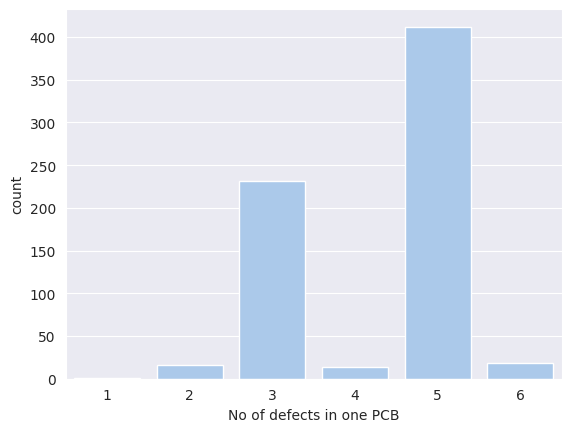

In [ ]:
#Visualizing the no of defects in each pcb
df_multiple_defects=pd.DataFrame(df_annot['filename'].value_counts())
sns.countplot(df_multiple_defects,x='count')
plt.xlabel('No of defects in one PCB')

In [ ]:
#Defining a function to view image along with bounding box

def draw_bounding_boxes(image_path, bounding_boxes,annotation):
    """
    Draws multiple bounding boxes on an image using Matplotlib.

    Args:
        image_path: The path to the image file.
        bounding_boxes: A list of bounding boxes, each represented as a tuple or list containing
                       (min_x, min_y, max_x, max_y).
    """

    # Load the image
    img = plt.imread(image_path)

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(15,10))

    # Display the image
    ax.imshow(img)

    # Draw each bounding box
    for bbox in bounding_boxes:
        min_x, min_y, max_x, max_y = bbox
        width = max_x - min_x
        height = max_y - min_y
        rect = patches.Rectangle((min_x, min_y), width, height, linewidth=1, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Calculate the centroid of the bounding box
        centroid_x = (min_x + max_x) / 2
        centroid_y = (min_y + max_y) / 2

        # Add the annotation to the centroid
        ax.annotate( annotation,(centroid_x,centroid_y),(max_x+20,max_y+20),
            fontsize=10,color='white',
            horizontalalignment='right', verticalalignment='top')

    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    # Show the plot
    plt.show()


In [ ]:
#Getting filename from filepath
filepath=img_path_list[0]
filename=re.sub(r'.+/([\w_]+\.jpg)',r'\1',filepath)
filename

'05_open_circuit_03.jpg'

In [ ]:
def visualize_annotations(list_image_path, df):
    for i in list_image_path:
        filepath = i
        filename = re.sub(r'.+/([\w_]+\.jpg)', r'\1', filepath)
        df_selected = df[df['filename'] == filename]
        width  = df_selected['width'].values
        height = df_selected['height'].values

        # check if 'class' or 'class_name' exists
        if 'class_name' in df_selected.columns:
            class_name = df_selected['class_name'].values
        elif 'class' in df_selected.columns:
            class_name = df_selected['class'].values
        else:
            raise KeyError("No class column found in dataframe")

        xmin = df_selected['xmin'].values
        ymin = df_selected['ymin'].values
        xmax = df_selected['xmax'].values
        ymax = df_selected['ymax'].values

        bbox = zip(xmin, ymin, xmax, ymax)
        draw_bounding_boxes(filepath, bbox, class_name[0])


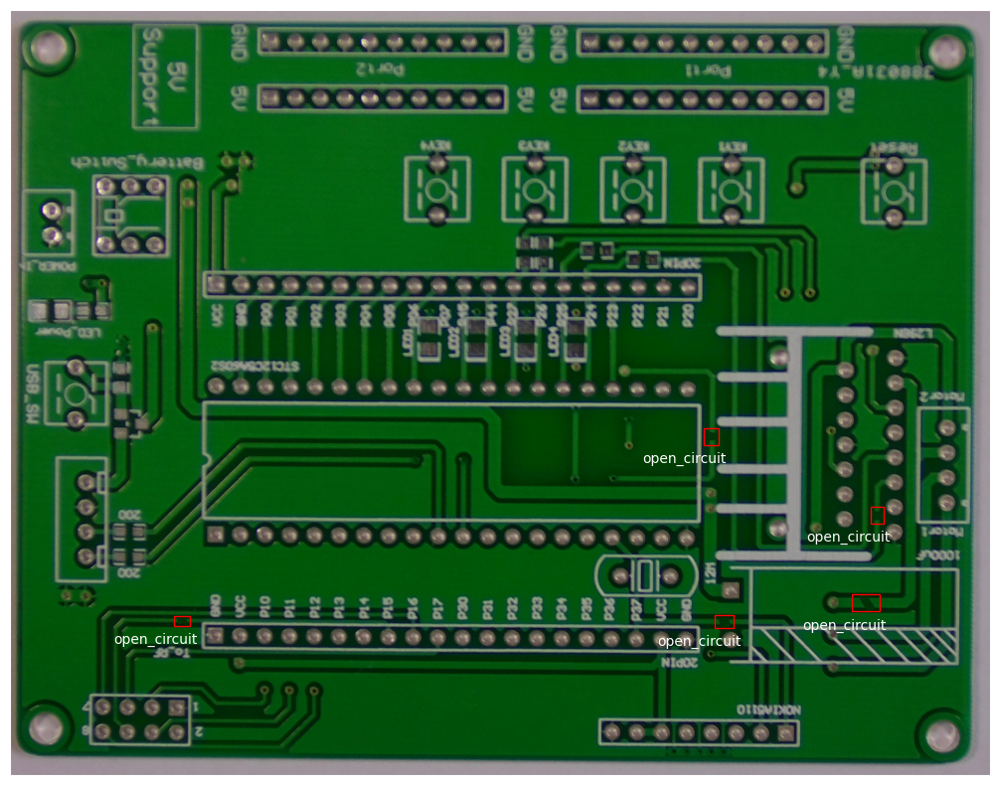

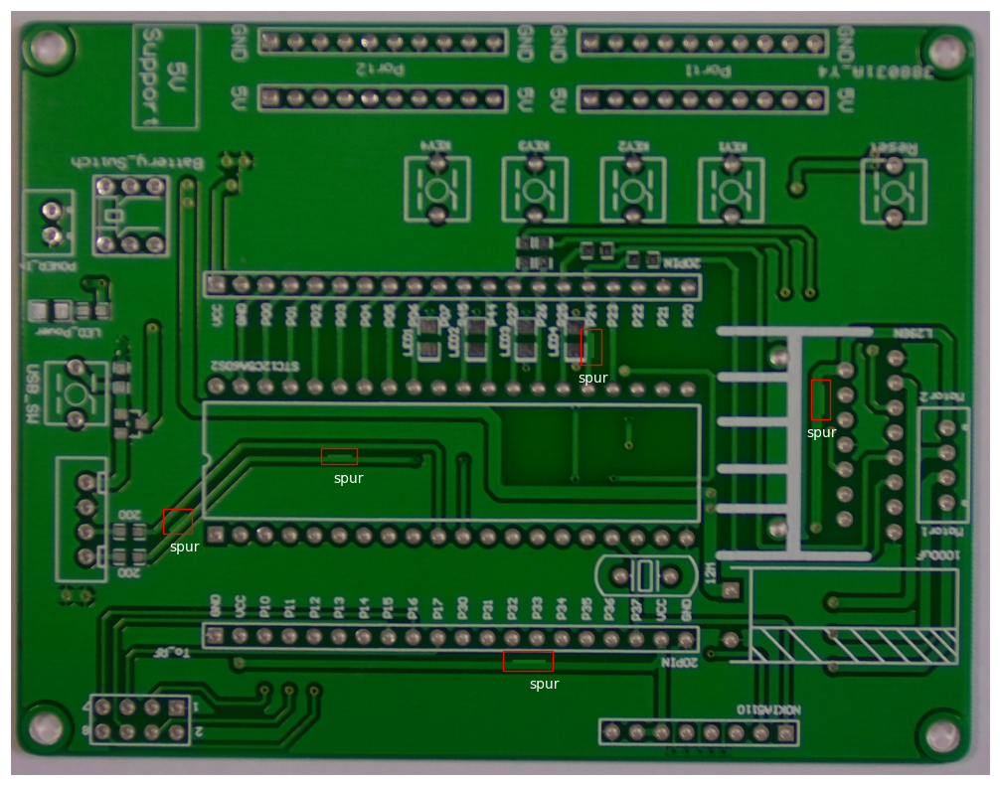

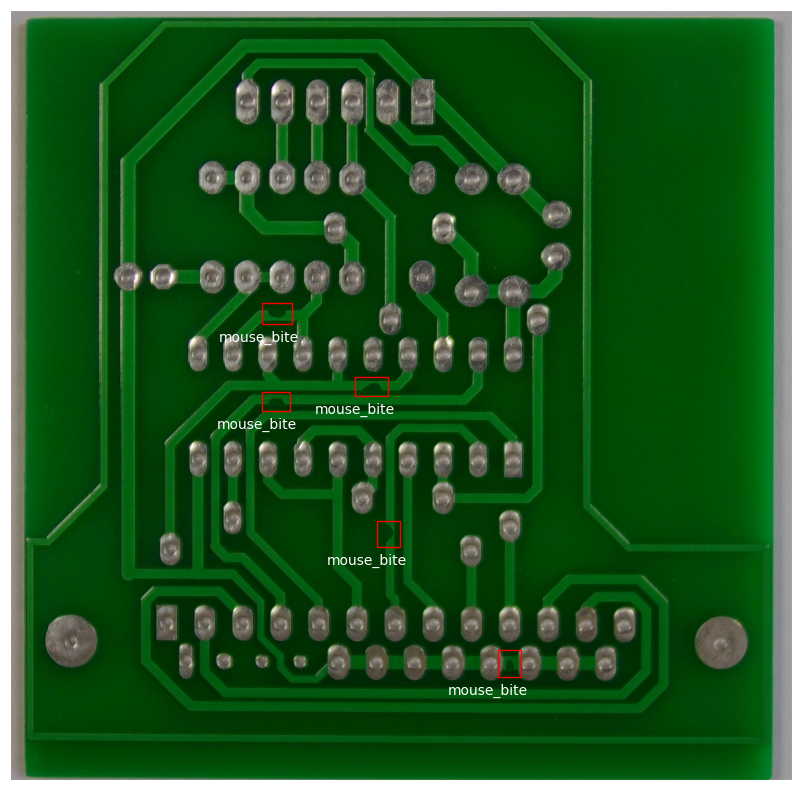

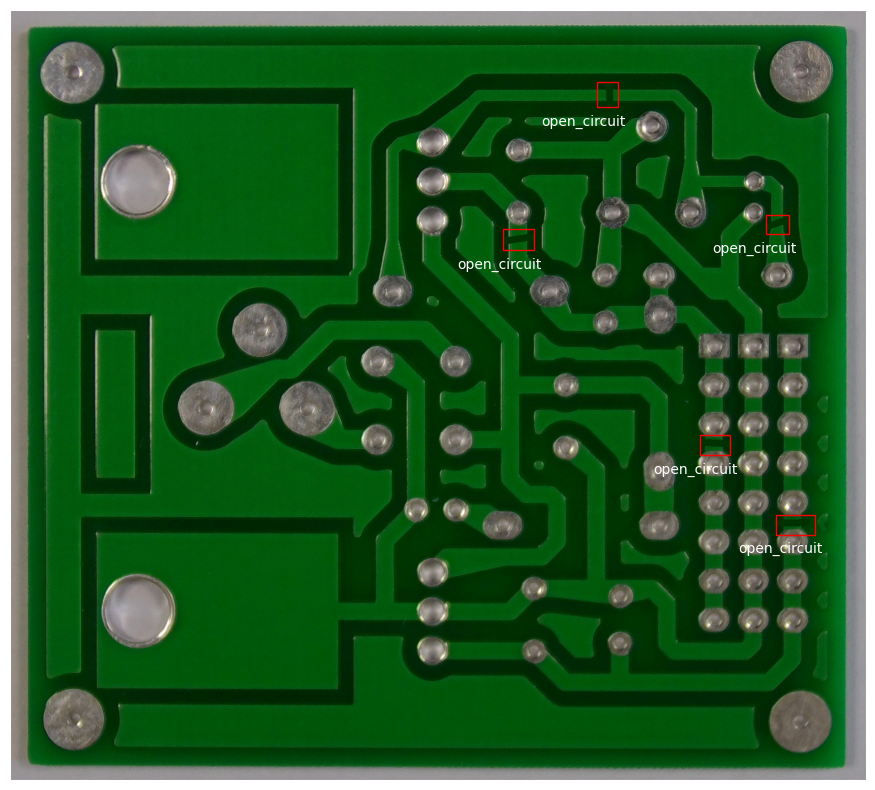

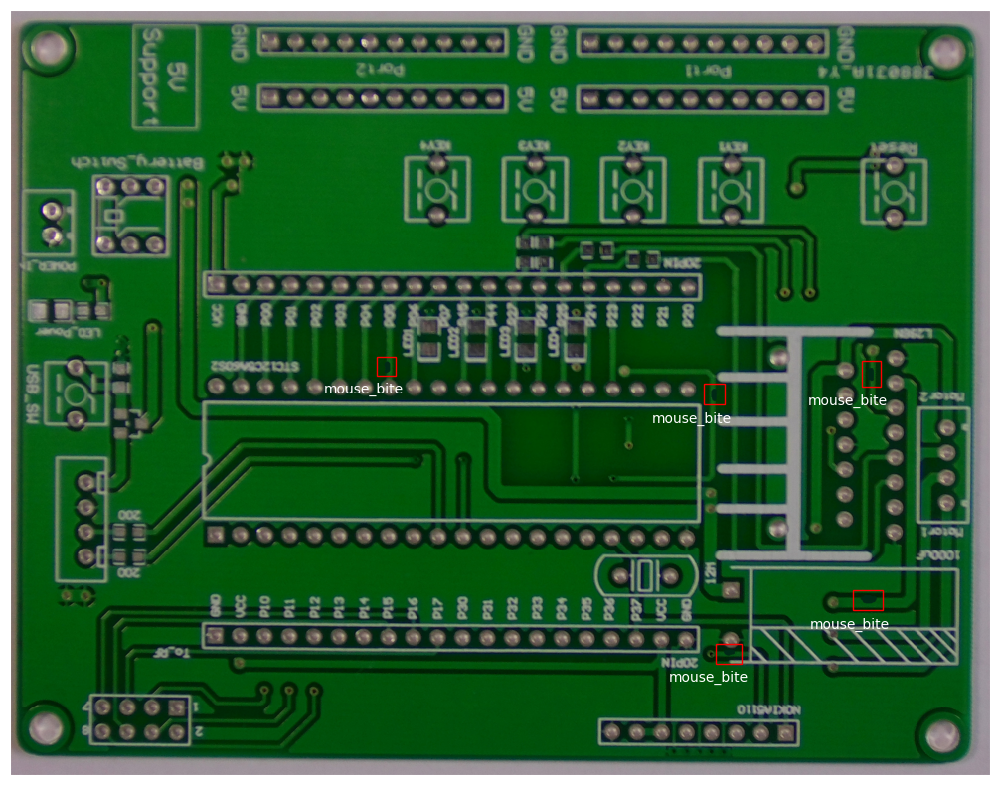

In [ ]:
image_path_shuffle=img_path_list
random.shuffle(image_path_shuffle)

visualize_annotations(image_path_shuffle[0:5],df_annot)

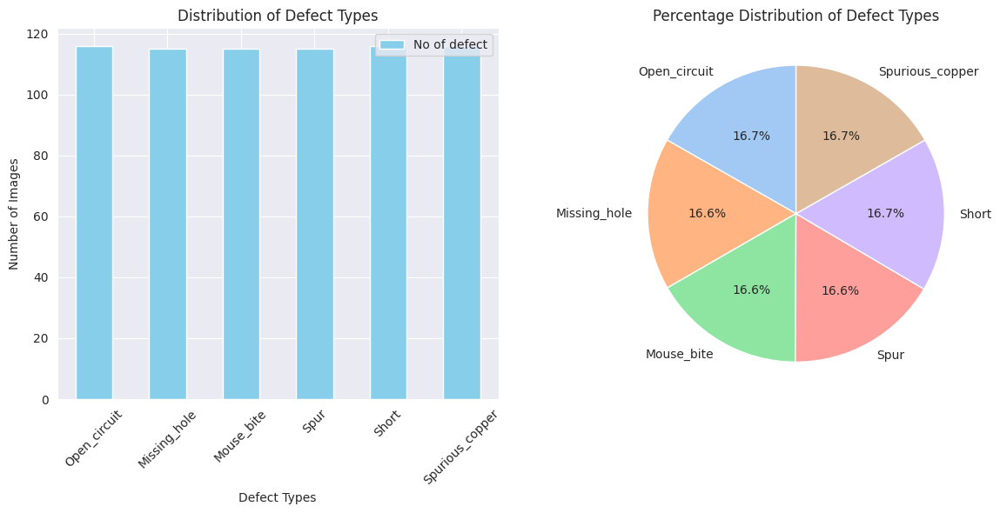

Total images: 693
Average images per class: 115.5
Standard deviation: 0.5


In [ ]:
# Cell: Class distribution visualization
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
df_defect.plot(kind='bar', color='skyblue', ax=plt.gca())
plt.title('Distribution of Defect Types')
plt.xlabel('Defect Types')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
plt.pie(df_defect['No of defect'].values, labels=df_defect.index, autopct='%1.1f%%', startangle=90)
plt.title('Percentage Distribution of Defect Types')
plt.tight_layout()
plt.show()

# Print statistics
print(f"Total images: {df_defect['No of defect'].sum()}")
print(f"Average images per class: {df_defect['No of defect'].mean():.1f}")
print(f"Standard deviation: {df_defect['No of defect'].std():.1f}")


In [ ]:
# Cell: Analyze image dimensions and properties
from PIL import Image
import numpy as np

def analyze_image_properties(img_dir, types_defect):
    image_stats = {
        'widths': [],
        'heights': [],
        'channels': [],
        'file_sizes': []
    }

    for defect_type in types_defect:
        defect_path = os.path.join(img_dir, defect_type)
        for img_file in os.listdir(defect_path)[:5]:  # Sample 5 images per class
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(defect_path, img_file)

                # Get image properties
                with Image.open(img_path) as img:
                    width, height = img.size
                    channels = len(img.getbands()) if img.mode in ['RGB', 'RGBA'] else 1

                image_stats['widths'].append(width)
                image_stats['heights'].append(height)
                image_stats['channels'].append(channels)
                image_stats['file_sizes'].append(os.path.getsize(img_path))

    return image_stats

# Analyze image properties
img_stats = analyze_image_properties(img_dir, types_defect)

# Display statistics
print("Image Properties Analysis:")
print(f"Width range: {min(img_stats['widths'])} - {max(img_stats['widths'])}")
print(f"Height range: {min(img_stats['heights'])} - {max(img_stats['heights'])}")
print(f"Average dimensions: {np.mean(img_stats['widths']):.1f} x {np.mean(img_stats['heights']):.1f}")
print(f"Channels: {set(img_stats['channels'])}")
print(f"File size range: {min(img_stats['file_sizes'])//1024}KB - {max(img_stats['file_sizes'])//1024}KB")


Image Properties Analysis:
Width range: 2240 - 3056
Height range: 1586 - 2530
Average dimensions: 2755.0 x 2133.1
Channels: {3}
File size range: 902KB - 1674KB


In [ ]:
# Cell: Data augmentation using ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
import cv2

def create_augmented_images(source_dir, target_class, num_augmented=20):
    """Create augmented images for classes with fewer samples"""

    # Define augmentation parameters
    datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest',
        brightness_range=[0.8, 1.2],
        channel_shift_range=20
    )

    # Create augmented directory
    aug_dir = f"{destination_dir}_augmented"
    os.makedirs(aug_dir, exist_ok=True)

    class_dir = os.path.join(img_dir, target_class)
    images = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    print(f"Creating {num_augmented} augmented images for {target_class}...")

    for i in range(num_augmented):
        # Select random image from class
        img_file = np.random.choice(images)
        img_path = os.path.join(class_dir, img_file)

        # Load and augment image
        img = load_img(img_path)
        x = img_to_array(img)
        x = x.reshape((1,) + x.shape)

        # Generate augmented image
        aug_iter = datagen.flow(x, batch_size=1)
        aug_image = next(aug_iter)[0].astype('uint8')

        # Save augmented image
        aug_filename = f"aug_{target_class}_{i}_{img_file}"
        aug_path = os.path.join(aug_dir, aug_filename)
        Image.fromarray(aug_image).save(aug_path)

    print(f"Augmented images saved in: {aug_dir}")

# Check for class imbalance and create augmented data
min_samples = df_defect['No of defect'].min()
max_samples = df_defect['No of defect'].max()
threshold = max_samples * 0.6  # Classes with less than 60% of max samples

print("Class Imbalance Analysis:")
for class_name in df_defect.index:
    count = df_defect.loc[class_name, 'No of defect']
    if count < threshold:
        print(f"{class_name}: {count} images (needs augmentation)")
        create_augmented_images(img_dir, class_name, int(threshold - count))
    else:
        print(f"{class_name}: {count} images (sufficient)")


Class Imbalance Analysis:
Open_circuit: 116 images (sufficient)
Missing_hole: 115 images (sufficient)
Mouse_bite: 115 images (sufficient)
Spur: 115 images (sufficient)
Short: 116 images (sufficient)
Spurious_copper: 116 images (sufficient)


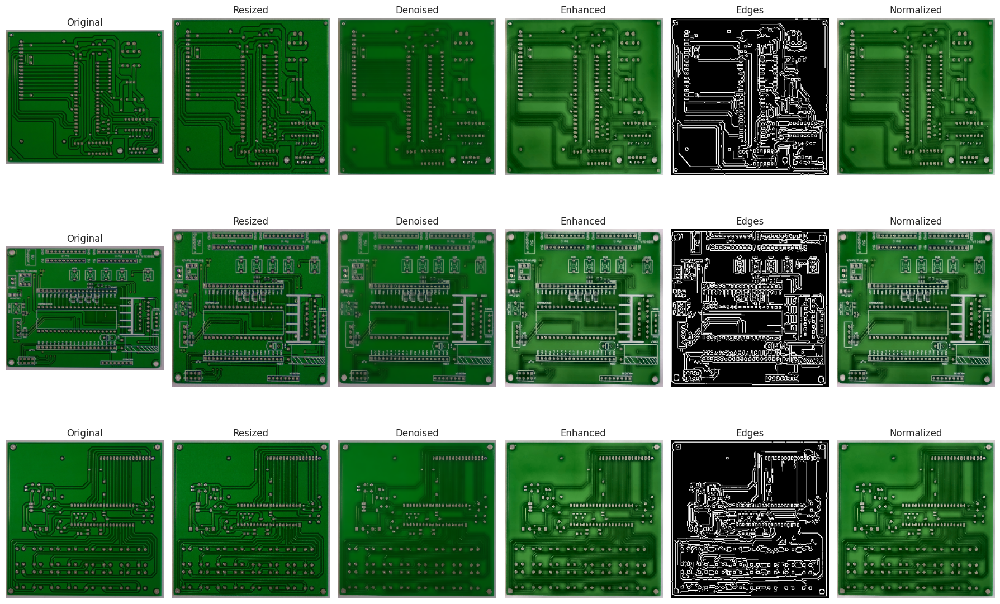

In [ ]:
# Cell: Image preprocessing utilities
import cv2
from skimage import exposure, filters
from scipy import ndimage

def preprocess_image(image_path, target_size=(224, 224)):
    """Apply various preprocessing techniques"""

    # Load image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 1. Resize image
    img_resized = cv2.resize(img_rgb, target_size)

    # 2. Noise reduction
    img_denoised = cv2.bilateralFilter(img_resized, 9, 75, 75)

    # 3. Histogram equalization (CLAHE)
    img_lab = cv2.cvtColor(img_denoised, cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img_lab[:,:,0] = clahe.apply(img_lab[:,:,0])
    img_enhanced = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)

    # 4. Edge enhancement
    img_gray = cv2.cvtColor(img_enhanced, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 50, 150)

    # 5. Normalization
    img_normalized = img_enhanced.astype('float32') / 255.0

    return {
        'original': img_rgb,
        'resized': img_resized,
        'denoised': img_denoised,
        'enhanced': img_enhanced,
        'edges': edges,
        'normalized': img_normalized
    }

# Demonstrate preprocessing on sample images
sample_images = []
for defect_type in types_defect[:3]:  # Show for first 3 classes
    class_path = os.path.join(img_dir, defect_type)
    sample_img = os.listdir(class_path)[0]
    sample_images.append(os.path.join(class_path, sample_img))

# Apply preprocessing and visualize
fig, axes = plt.subplots(len(sample_images), 6, figsize=(18, 4*len(sample_images)))
processing_steps = ['original', 'resized', 'denoised', 'enhanced', 'edges', 'normalized']

for i, img_path in enumerate(sample_images):
    processed = preprocess_image(img_path)

    for j, step in enumerate(processing_steps):
        ax = axes[i, j] if len(sample_images) > 1 else axes[j]

        if step == 'edges':
            ax.imshow(processed[step], cmap='gray')
        else:
            ax.imshow(processed[step])

        ax.set_title(f"{step.capitalize()}")
        ax.axis('off')

        if j == 0:
            defect_name = os.path.basename(os.path.dirname(img_path))
            ax.set_ylabel(defect_name, rotation=90, va='center')

plt.tight_layout()
plt.show()


In [ ]:
# Cell: Data quality checks
def check_data_quality(img_dir, types_defect):
    """Check for corrupted images and data quality issues"""

    quality_report = {
        'corrupted_files': [],
        'small_images': [],
        'large_images': [],
        'unusual_ratios': []
    }

    for defect_type in types_defect:
        class_path = os.path.join(img_dir, defect_type)

        for img_file in os.listdir(class_path):
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(class_path, img_file)

                try:
                    # Try to open image
                    with Image.open(img_path) as img:
                        width, height = img.size

                        # Check for small images
                        if width < 50 or height < 50:
                            quality_report['small_images'].append(img_path)

                        # Check for very large images
                        elif width > 2000 or height > 2000:
                            quality_report['large_images'].append(img_path)

                        # Check for unusual aspect ratios
                        ratio = width / height
                        if ratio > 3 or ratio < 0.33:
                            quality_report['unusual_ratios'].append((img_path, ratio))

                except Exception as e:
                    quality_report['corrupted_files'].append((img_path, str(e)))

    return quality_report

# Perform quality assessment
quality_report = check_data_quality(img_dir, types_defect)

print("Data Quality Assessment:")
print(f"Corrupted files: {len(quality_report['corrupted_files'])}")
print(f"Small images (<50px): {len(quality_report['small_images'])}")
print(f"Large images (>2000px): {len(quality_report['large_images'])}")
print(f"Unusual aspect ratios: {len(quality_report['unusual_ratios'])}")

if quality_report['corrupted_files']:
    print("\nCorrupted files:")
    for file, error in quality_report['corrupted_files'][:5]:  # Show first 5
        print(f"  {file}: {error}")


Data Quality Assessment:
Corrupted files: 0
Small images (<50px): 0
Large images (>2000px): 693
Unusual aspect ratios: 0


morphological operations

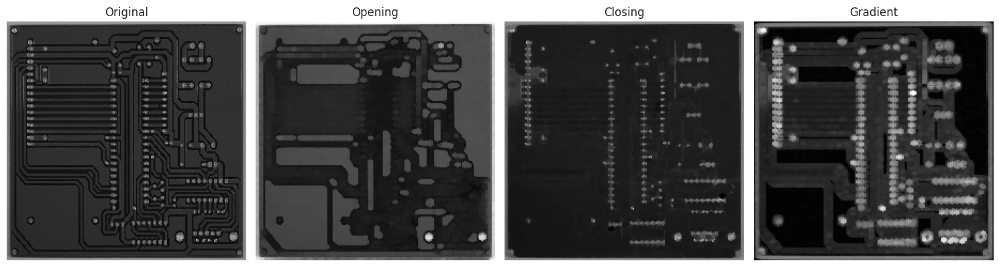

In [ ]:
# Cell: Basic morphological operations
import cv2

def apply_morphological_ops(image_path):
    img = cv2.imread(image_path, 0)  # Read as grayscale
    img = cv2.resize(img, (224, 224))

    # Create kernel
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))

    # Apply operations
    opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

    return img, opening, closing, gradient

# Apply to sample image
sample_path = os.path.join(img_dir, types_defect[0], os.listdir(os.path.join(img_dir, types_defect[0]))[0])
original, opening, closing, gradient = apply_morphological_ops(sample_path)

# Display results
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
images = [original, opening, closing, gradient]
titles = ['Original', 'Opening', 'Closing', 'Gradient']

for i, (img, title) in enumerate(zip(images, titles)):
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(title)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


Frequency Domain Filtering

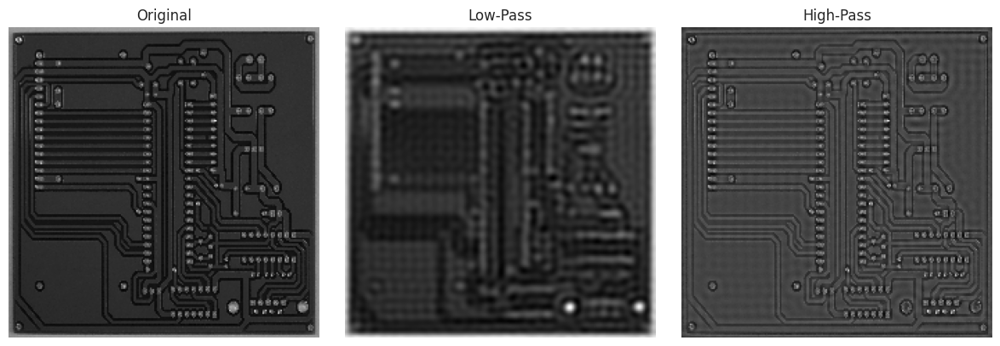

In [ ]:
# Cell: Simple frequency filtering
import numpy as np
from scipy.fft import fft2, ifft2, fftshift, ifftshift

def frequency_filter(image_path):
    img = cv2.imread(image_path, 0)
    img = cv2.resize(img, (224, 224)).astype(np.float32)

    # FFT
    f_transform = fftshift(fft2(img))
    rows, cols = img.shape
    crow, ccol = rows//2, cols//2

    # Create masks
    mask_low = np.zeros((rows, cols))
    cv2.circle(mask_low, (ccol, crow), 30, 1, -1)  # Low-pass

    mask_high = 1 - mask_low  # High-pass

    # Apply filters
    low_filtered = ifft2(ifftshift(f_transform * mask_low))
    high_filtered = ifft2(ifftshift(f_transform * mask_high))

    return img, np.real(low_filtered), np.real(high_filtered)

# Apply filtering
original, low_pass, high_pass = frequency_filter(sample_path)

# Display results
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
images = [original, low_pass, high_pass]
titles = ['Original', 'Low-Pass', 'High-Pass']

for i, (img, title) in enumerate(zip(images, titles)):
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(title)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


Texture Analysis

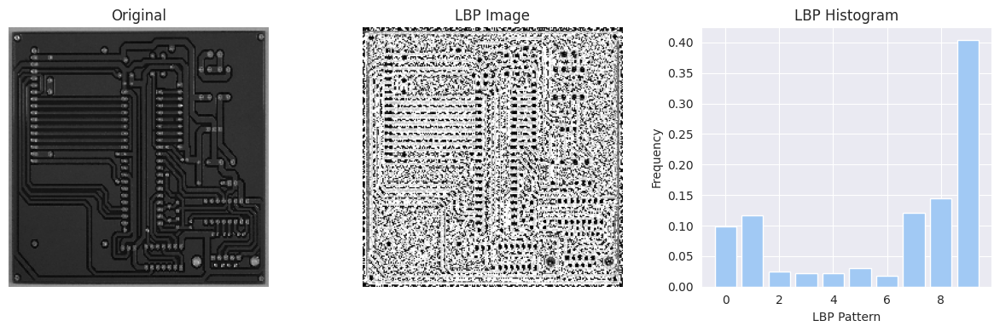

Texture features extracted successfully!


In [ ]:
# Cell: Basic texture analysis
from skimage.feature import local_binary_pattern

def texture_analysis(image_path):
    img = cv2.imread(image_path, 0)
    img = cv2.resize(img, (224, 224))

    # Local Binary Pattern
    lbp = local_binary_pattern(img, 8, 3, method='uniform')

    # Calculate histogram
    hist, _ = np.histogram(lbp.ravel(), bins=10, range=(0, 10))
    hist = hist.astype(float)
    hist /= (hist.sum() + 1e-7)

    return img, lbp, hist

# Apply texture analysis
original, lbp_img, lbp_hist = texture_analysis(sample_path)

# Display results
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].imshow(original, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(lbp_img, cmap='gray')
axes[1].set_title('LBP Image')
axes[1].axis('off')

axes[2].bar(range(len(lbp_hist)), lbp_hist)
axes[2].set_title('LBP Histogram')
axes[2].set_xlabel('LBP Pattern')
axes[2].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

print("Texture features extracted successfully!")


Final preprocessing summary

In [ ]:
# Cell: Final preprocessing summary
def create_preprocessing_summary():
    """Create a comprehensive summary of preprocessing steps"""

    summary = {
        'dataset_info': {
            'total_classes': len(types_defect),
            'class_names': types_defect,
            'total_images': df_defect['No of defect'].sum(),
            'images_per_class': df_defect['No of defect'].to_dict()
        },
        'preprocessing_applied': [
            'Image resizing and normalization',
            'Noise reduction (bilateral filtering)',
            'Contrast enhancement (CLAHE)',
            'Edge detection for feature extraction',
            'Data augmentation for class balancing',
            'Quality assessment and validation'
        ],
        'recommendations': [
            'Consider additional augmentation for minority classes',
            'Apply consistent preprocessing pipeline during training',
            'Monitor for overfitting due to class imbalance',
            'Use stratified sampling for train/validation split'
        ]
    }

    return summary

# Generate and display summary
summary = create_preprocessing_summary()

print("="*50)
print("PREPROCESSING SUMMARY")
print("="*50)

print(f"Dataset: PCB Defects Detection")
print(f"Total Classes: {summary['dataset_info']['total_classes']}")
print(f"Total Images: {summary['dataset_info']['total_images']}")

print("\nClass Distribution:")
for class_name, count in summary['dataset_info']['images_per_class'].items():
    percentage = (count / summary['dataset_info']['total_images']) * 100
    print(f"  {class_name}: {count} images ({percentage:.1f}%)")

print("\nPreprocessing Steps Applied:")
for i, step in enumerate(summary['preprocessing_applied'], 1):
    print(f"  {i}. {step}")

print("\nRecommendations:")
for i, rec in enumerate(summary['recommendations'], 1):
    print(f"  {i}. {rec}")

print("="*50)
print("Preprocessing completed successfully!")
print("Data is now ready for model training.")
print("="*50)


PREPROCESSING SUMMARY
Dataset: PCB Defects Detection
Total Classes: 6
Total Images: 693

Class Distribution:
  Open_circuit: 116 images (16.7%)
  Missing_hole: 115 images (16.6%)
  Mouse_bite: 115 images (16.6%)
  Spur: 115 images (16.6%)
  Short: 116 images (16.7%)
  Spurious_copper: 116 images (16.7%)

Preprocessing Steps Applied:
  1. Image resizing and normalization
  2. Noise reduction (bilateral filtering)
  3. Contrast enhancement (CLAHE)
  4. Edge detection for feature extraction
  5. Data augmentation for class balancing
  6. Quality assessment and validation

Recommendations:
  1. Consider additional augmentation for minority classes
  2. Apply consistent preprocessing pipeline during training
  3. Monitor for overfitting due to class imbalance
  4. Use stratified sampling for train/validation split
Preprocessing completed successfully!
Data is now ready for model training.
